In [14]:
import geopandas, osmnx, networkx, folium, mapclassify, contextily, pyscipopt
print("Imports OK 👍")

Imports OK 👍


In [15]:
# ======================================================================
# 0 · PARAMETERS & ONE-SHOT INSTALL CHECK
# ======================================================================
# If osmnx & friends aren't in your env run once:
# !mamba install -c conda-forge osmnx geopandas pyscipopt folium mapclassify contextily -y

DISTRICT_NAME = "Friedrichshain-Kreuzberg, Berlin, Germany"  # « pick your Bezirk »
D_MAX         = 900       # distance de marche max (m)
GRID_SPACING  = 200       # pas de la grille hexagonale (m)
CRS_METRIC    = 3857   # Web-Mercator, unité = 

import warnings           # ← ICI !
import geopandas as gpd
import pandas    as pd
import numpy     as np
import osmnx      as ox
import networkx   as nx
import math, warnings
from shapely.geometry import Point, Polygon
from pyscipopt import Model, quicksum
import folium, contextily as ctx

warnings.filterwarnings("ignore", category=UserWarning)
ox.settings.log_console = False

In [16]:
# ======================================================================
# 1 · LOAD DISTRICT POLYGON  (tiny – comes straight from OSM)
# ======================================================================
district_gdf = ox.geocode_to_gdf(DISTRICT_NAME).to_crs(CRS_METRIC)
district_poly = district_gdf.geometry.iloc[0]

In [17]:
# ==============================================================
# 2 · BÂTIMENTS  ➜  DEMANDE  (un point = un bâtiment)
# ==============================================================
tags_bldg = {"building": True}
poly_ll   = gpd.GeoSeries([district_poly], crs=CRS_METRIC).to_crs(4326).iloc[0]

buildings = ox.features_from_polygon(poly_ll, tags_bldg)
buildings = buildings[buildings.geom_type == "Polygon"].to_crs(CRS_METRIC)

# centroïdes comme points de demande
demand = buildings.geometry.centroid
demand = gpd.GeoDataFrame(geometry=demand, crs=CRS_METRIC)
demand.reset_index(drop=True, inplace=True)

print(f"→ {len(demand):,} bâtiments (points de demande)")

→ 12,667 bâtiments (points de demande)


In [18]:

# ==============================================================
# 3 · BORNES EXISTANTES  (WFS puis fallback OSM)
# ==============================================================
def fetch_chargers_wfs(poly):
    url = "https://gdi.berlin.de/services/wfs/eladeinfrastruktur"
    params = dict(
        service="WFS", version="2.0.0", request="GetFeature",
        typeNames="eladeinfrastruktur", outputFormat="application/json",
        srsName="EPSG:3857"
    )
    gdf = gpd.read_file(url, params=params)        # déjà 3857
    gdf = gdf[gdf.within(poly)]
    if gdf.empty:
        raise ValueError("Aucune borne trouvée via WFS")
    return gdf[["geometry"]].copy()

def fetch_chargers_osm(poly):
    tags = {"amenity": "charging_station"}
    poly_ll = gpd.GeoSeries([poly], crs=CRS_METRIC).to_crs(4326).iloc[0]
    gdf = ox.features_from_polygon(poly_ll, tags)
    if gdf.empty:
        raise ValueError("Aucune borne trouvée via OSM")
    if gdf.crs is None:
        gdf.set_crs(4326, inplace=True)
    gdf = gdf[gdf.geom_type == "Point"].to_crs(CRS_METRIC)
    return gdf[["geometry"]].copy()

try:
    chargers_exist = fetch_chargers_wfs(district_poly)
except Exception as e:
    print("⚠️  WFS échec → fallback OSM :", e)
    chargers_exist = fetch_chargers_osm(district_poly)

chargers_exist["existing"] = True
print(f"→ {len(chargers_exist):,} bornes existantes")


⚠️  WFS échec → fallback OSM : HTTP Error 400: 
→ 161 bornes existantes


In [19]:

# ==============================================================
# 4 · GRILLE HEXAGONALE  ➜  CANDIDATS POTENTIELS
#    (on évite +10k candidats en utilisant une grille régulière)
# ==============================================================
def hex_grid(poly: Polygon, spacing: float) -> gpd.GeoDataFrame:
    minx, miny, maxx, maxy = poly.bounds
    dx = spacing * 3/2
    dy = spacing * math.sqrt(3)

    cols = np.arange(minx - spacing, maxx + spacing, dx)
    rows = np.arange(miny - spacing, maxy + spacing, dy)

    hexes = []
    for j, y in enumerate(rows):
        for i, x in enumerate(cols):
            x_shift = x + (spacing*3/4 if j % 2 else 0)
            p = Point(x_shift, y)
            if p.within(poly):
                hexes.append(p)
    gdf = gpd.GeoDataFrame(geometry=hexes, crs=CRS_METRIC)
    return gdf

grid_pts = hex_grid(district_poly, GRID_SPACING)
grid_pts["existing"] = False
print(f"→ {len(grid_pts):,} points grille (candidats)")


→ 521 points grille (candidats)


In [20]:

# ==============================================================
# 5 · ASSEMBLER TOUS LES CANDIDATS
# ==============================================================
cands = pd.concat([chargers_exist, grid_pts], ignore_index=True)
cands.reset_index(drop=True, inplace=True)



In [21]:

# ==============================================================
# 6 · RÉSEAU PIÉTON & SNAP AUX NŒUDS
# ==============================================================
G = ox.graph_from_polygon(poly_ll, network_type="walk", simplify=True)
G = ox.project_graph(G, to_crs=CRS_METRIC)

demand["node"] = ox.nearest_nodes(G, demand.geometry.x, demand.geometry.y)
cands["node"]  = ox.nearest_nodes(G, cands.geometry.x,  cands.geometry.y)



In [22]:

# ==============================================================
# 7 · MATRICE DE COUVERTURE  (listes d’indices)
# ==============================================================
cover = [set() for _ in range(len(demand))]

for j, cand_node in enumerate(cands.node):
    for n, dist in nx.single_source_dijkstra_path_length(
            G, cand_node, weight="length", cutoff=D_MAX
        ).items():
        for i in np.where(demand.node.values == n)[0]:
            cover[i].add(j)

if any(len(s)==0 for s in cover):
    raise RuntimeError("Des bâtiments restent hors portée – augmenter D_MAX")


In [23]:

# ==============================================================
# 8 · MODÈLE PySCIPOpt  (Set Cover)
# ==============================================================
m = Model("EV_SetCover")
x = {}

for j, row in cands.iterrows():
    if row["existing"]:
        var = m.addVar(vtype="B", obj=0.0, name=f"x_{j}")
        m.addCons(var == 1)          # borne déjà installée
    else:
        var = m.addVar(vtype="B", obj=1.0, name=f"x_{j}")
    x[j] = var

for i, js in enumerate(cover):
    m.addCons(quicksum(x[j] for j in js) >= 1)   # chaque bâtiment couvert

m.setObjective(quicksum(x.values()), "minimize")
m.hideOutput()          # enlève le blabla du solveur
m.optimize()

assert m.getStatus() == "optimal"
nbr_new = int(m.getObjVal())
chosen_idx = [j for j in x if m.getVal(x[j]) > 0.5]
chosen = cands.loc[chosen_idx].copy()

print(f"✅  Solution optimale : {nbr_new} nouvelles bornes requises")
print("SCIP status :", m.getStatus())          # ← ajoute cette ligne
print("Gap       :", m.getGap())               # écart rel. (si applicable)
print("Best obj  :", m.getObjVal())            # valeur de la meilleure sol.


✅  Solution optimale : 165 nouvelles bornes requises
SCIP status : optimal
Gap       : 0.0
Best obj  : 165.0


In [24]:

# ==============================================================
# 9 · VISUALISATION FOLIUM
# ==============================================================
m_map = folium.Map(
    location=district_gdf.to_crs(4326).geometry.centroid.iloc[0].coords[0][::-1],
    zoom_start=13, tiles="OpenStreetMap"
)
folium.GeoJson(
    district_gdf.to_crs(4326).geometry.iloc[0],
    style_function=lambda *_: {"fillOpacity": 0, "color": "black"}
).add_to(m_map)

# --- buffers 700 m autour des bornes choisies ------------------
for _, r in chosen.iterrows():
    buf = (gpd.GeoSeries([r.geometry.buffer(D_MAX)], crs=CRS_METRIC)
                .to_crs(4326).iloc[0])
    folium.GeoJson(
        buf.__geo_interface__,
        style_function=lambda *_: {
            "fillOpacity": 0, "color": "black", "dashArray": "5,5", "weight": 1}
    ).add_to(m_map)

# --- bâtiments (bleu) -----------------------------------------
for _, r in demand.to_crs(4326).iterrows():
    folium.CircleMarker([r.geometry.y, r.geometry.x],
                        radius=1, color="blue", weight=0,
                        fill=True, fill_opacity=.3).add_to(m_map)

# --- bornes existantes (⚡ gris) -------------------------------
for _, r in chargers_exist.to_crs(4326).iterrows():
    folium.Marker([r.geometry.y, r.geometry.x],
                  icon=folium.Icon(color="gray", icon="bolt", prefix="fa")
                 ).add_to(m_map)

# --- nouvelles bornes choisies (⚡ rouge) ----------------------
new_chosen = chosen[~chosen["existing"]]
for _, r in new_chosen.to_crs(4326).iterrows():
    folium.Marker([r.geometry.y, r.geometry.x],
                  icon=folium.Icon(color="red", icon="bolt", prefix="fa")
                 ).add_to(m_map)

folium.LayerControl(collapsed=False).add_to(m_map)
m_map.save("kreuzberg_ev_solution.html")

print("🗺️  Carte interactive écrite → kreuzberg_ev_solution.html")
m_map

🗺️  Carte interactive écrite → kreuzberg_ev_solution.html


→ 12,667 bâtiments (points de demande)
→ 161 bornes existantes
→ 4 nouvelles bornes choisies


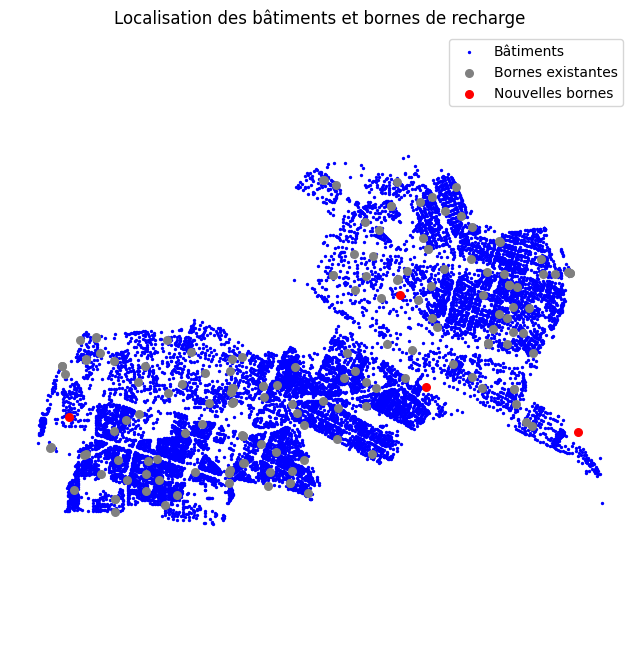

In [25]:
# ==============================================================
# 10 · Bilan + graphique statique
# ==============================================================

# -- Comptes lisibles --------------------------------------------------
print(f"→ {len(demand):,} bâtiments (points de demande)")
print(f"→ {len(chargers_exist):,} bornes existantes")
print(f"→ {len(new_chosen):,} nouvelles bornes choisies")

# -- Scatter matplotlib ------------------------------------------------
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 8))

ax.scatter(demand.geometry.x,
           demand.geometry.y,
           s=2, label="Bâtiments", color="blue")

ax.scatter(chargers_exist.geometry.x,
           chargers_exist.geometry.y,
           s=30, label="Bornes existantes", color="grey")

ax.scatter(new_chosen.geometry.x,
           new_chosen.geometry.y,
           s=30, label="Nouvelles bornes", color="red")

ax.set_aspect("equal", adjustable="datalim")
ax.axis("off")
ax.set_title("Localisation des bâtiments et bornes de recharge")
ax.legend(loc="upper right")

plt.show()
